# FINAL PROJECT

## Evaluation of trained model (YOLO v5)


In [25]:
import os
import random
import cv2
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import torch

In [26]:
detect_script = '/home/app/src/model/yolov5/detect.py'
validation_script = '/home/app/src/model/yolov5/val.py'
data_sku_110k_yaml = '/home/app/src/model/yolov5/data/SKU-110K.yaml'
#weights_file = '/home/app/src/model/yolov5/runs/train/exp3/weights/best.pt'
weights_file = '/home/app/src/model/import/best_2classes.pt'
single_image = '/home/app/src/model/datasets/SKU-110K/images/test_0.jpg'


#### After model being trained, weights must be provided in order to detect objetcs in a given image.
#### There are two threshold to configure before running detection script:
   Confidence (conf) and Intersection over Union (iou-thres).
   Confidence is how probable an object belong to a class [%]
   Intersection over Union is the metric to filter in the Non-maximum Suppression technique. 

In [3]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.5 --iou-thres 0.5 --name yolo_road_det

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 137

#### With conf=0.5 and iou-thres=0.5 the detection is pretty good.  137 objects are detected.

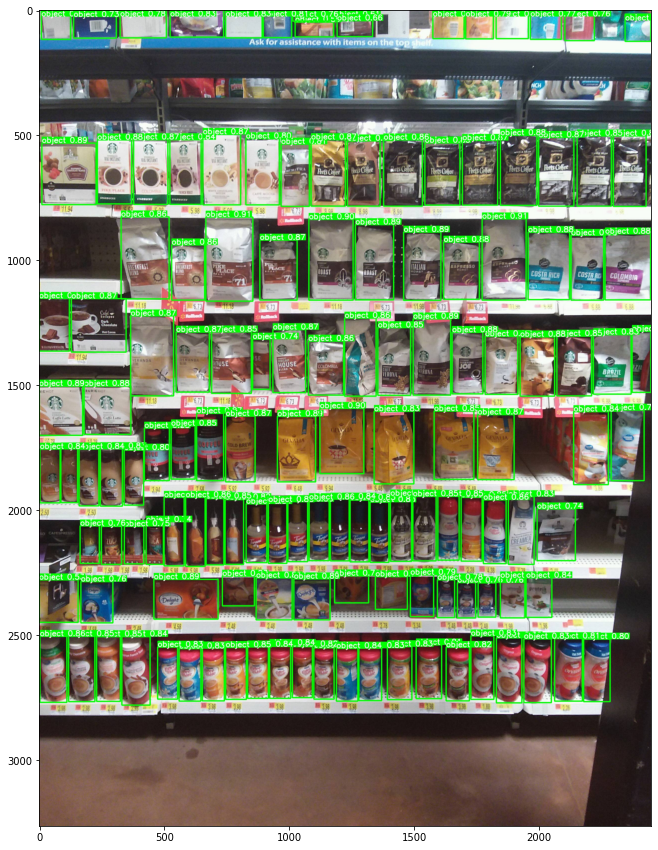

In [4]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det40/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

#### As there are many objects, labels are all over the place. With --hide-labels in the command, label are hidden. 

In [9]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.5 --iou-thres 0.5 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 137 

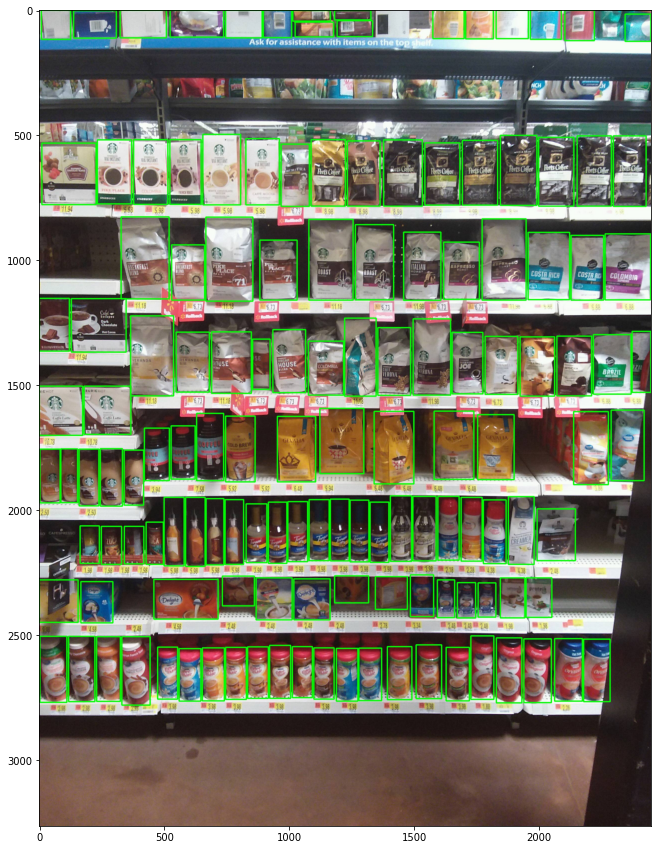

In [10]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det42/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Sweeping conf, iou-thres cte at 0.5 
#### With conf=0.25 and iou-thres=0.5 183 objects are detected. As can be seen there are many bounding box overlaps as the threshold of confidence is small. 

In [11]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.25 --iou-thres 0.5 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 183

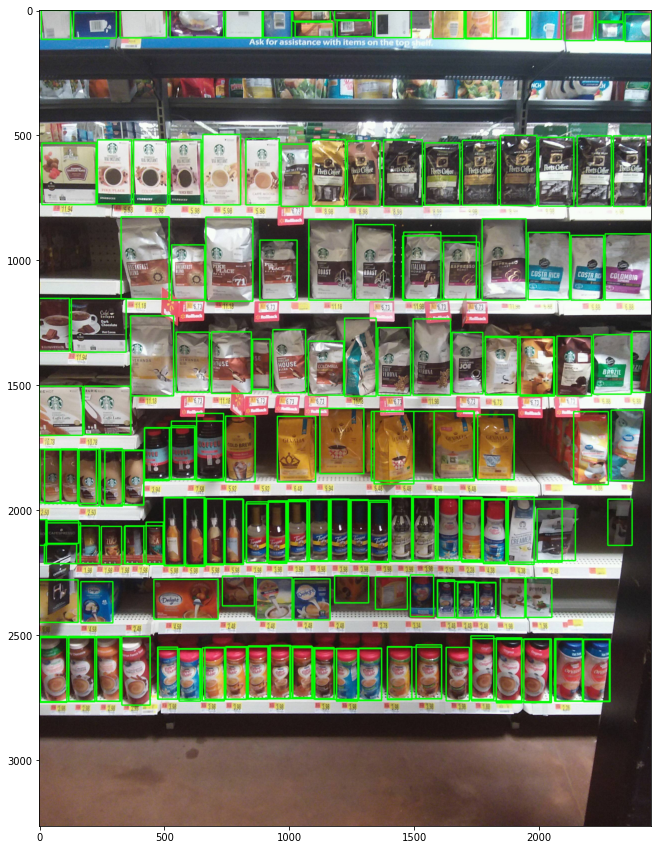

In [12]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det43/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Sweeping conf, iou-thres cte at 0.5 
#### With conf=0.75 and iou-thres=0.5 119 objects are detected. As can be seen there are many objects that are not detected as the threshold of confidence is big. 

In [13]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.75 --iou-thres 0.5 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.75, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 119

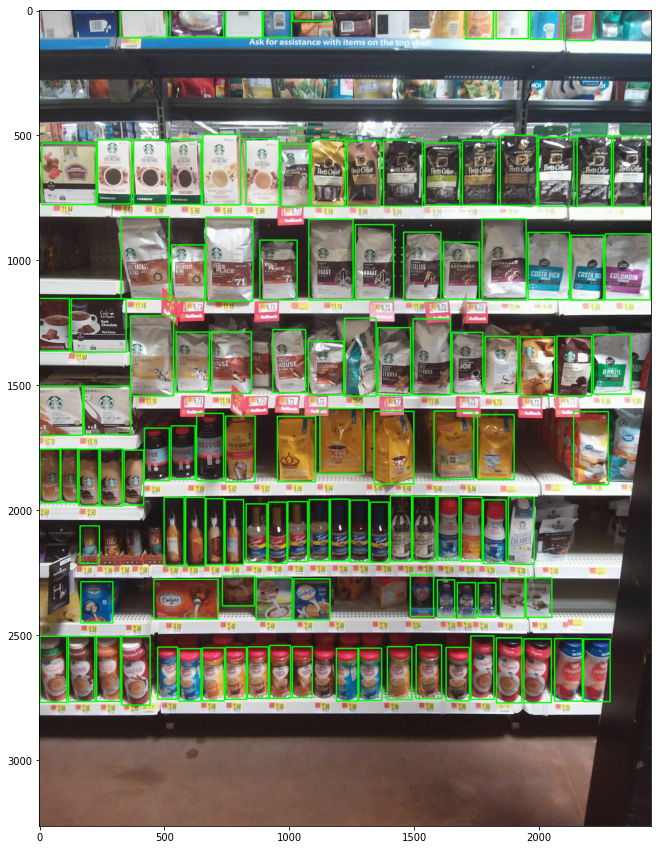

In [14]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det44/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Sweeping iou-thres,  conf cte at 0.5 
#### With conf=0.5 and iou-thres=0.95 281 objects are detected. As IoU factor is big many overlap are shown.

In [15]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.5 --iou-thres 0.95 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.95, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 281

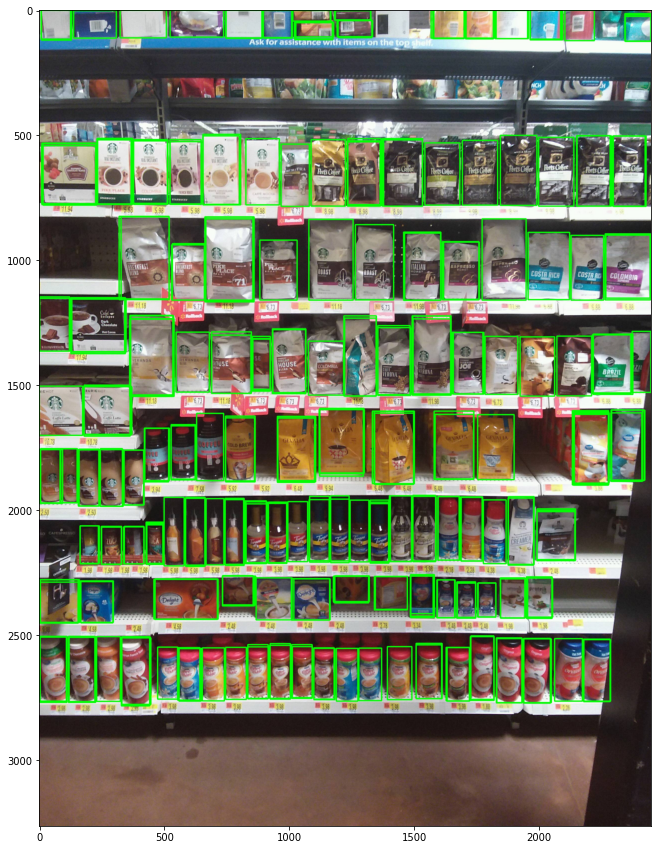

In [16]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det45/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Sweeping iou-thres,  conf cte at 0.5 
#### With conf=0.5 and iou-thres=0.75 137 objects are detected. A pretty good overall detection is obtained with this parameters. 

In [17]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.5 --iou-thres 0.75 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.75, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 137

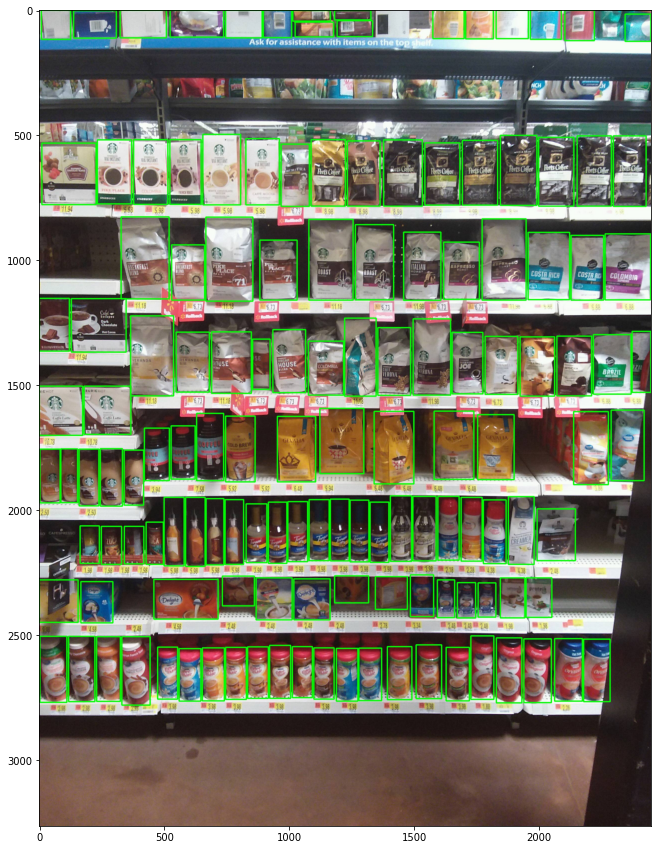

In [18]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det46/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Sweeping iou-thres,  conf cte at 0.5 
#### With conf=0.5 and iou-thres=0.25 137 objects are detected. A pretty good overall detection is obtained with this parameters. Seems that the same result as conf=0.5 and iou-thres=0.75 is obtained.

In [19]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.5 --iou-thres 0.25 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.25, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 137

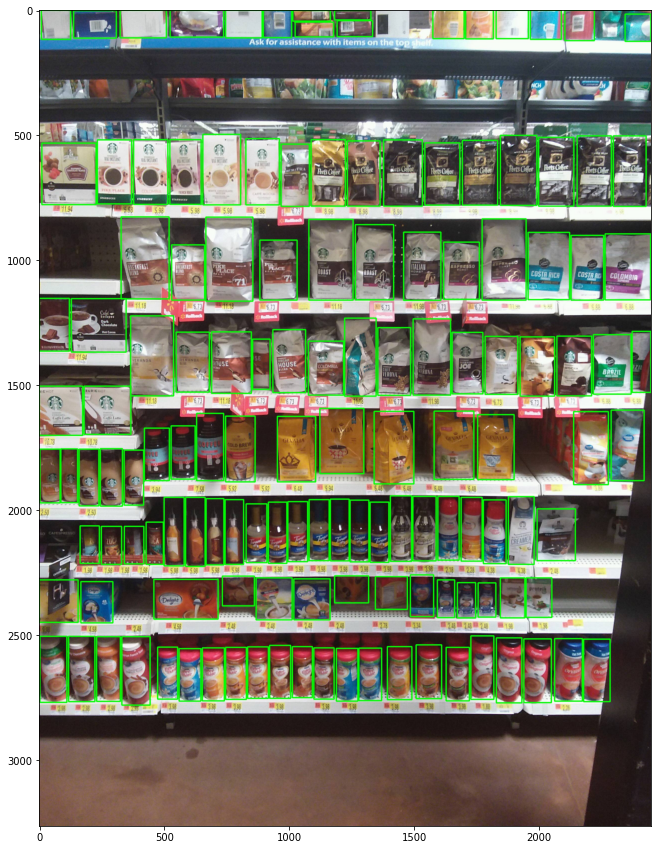

In [20]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det47/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Sweeping iou-thres,  conf cte at 0.5 
#### With conf=0.5 and iou-thres=0.05 137 objects are detected. A pretty good overall detection is obtained with this parameters. Seems that the same result as conf=0.5 and iou-thres=0.75 (or 0.25) is obtained.

In [21]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.5 --iou-thres 0.05 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.05, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 137

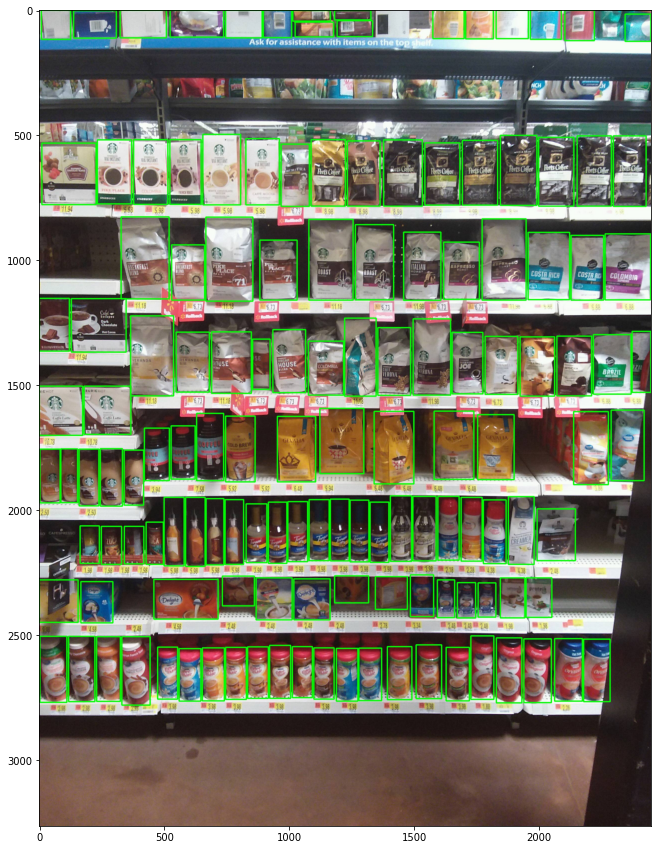

In [22]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det48/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Compromising both conf and iou-thres
#### With conf=0.25 and iou-thres=0.25 144 objects are detected. A pretty good overall detection is obtained with this parameters. A few overlaps are seen because of small conf but corrected since iou-thres is also small. 

In [23]:
!python $detect_script --source $single_image --weights $weights_file --conf 0.25 --iou-thres 0.25 --name yolo_road_det --hide-labels 

detect: weights=['/home/app/src/model/yolov5/runs/train/best.pt'], source=/home/app/src/model/datasets/SKU-110K/images/test_0.jpg, data=../model/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.25, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../model/yolov5/runs/detect, name=yolo_road_det, exist_ok=False, line_thickness=3, hide_labels=True, hide_conf=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/1 /home/app/src/model/datasets/SKU-110K/images/test_0.jpg: 640x480 14

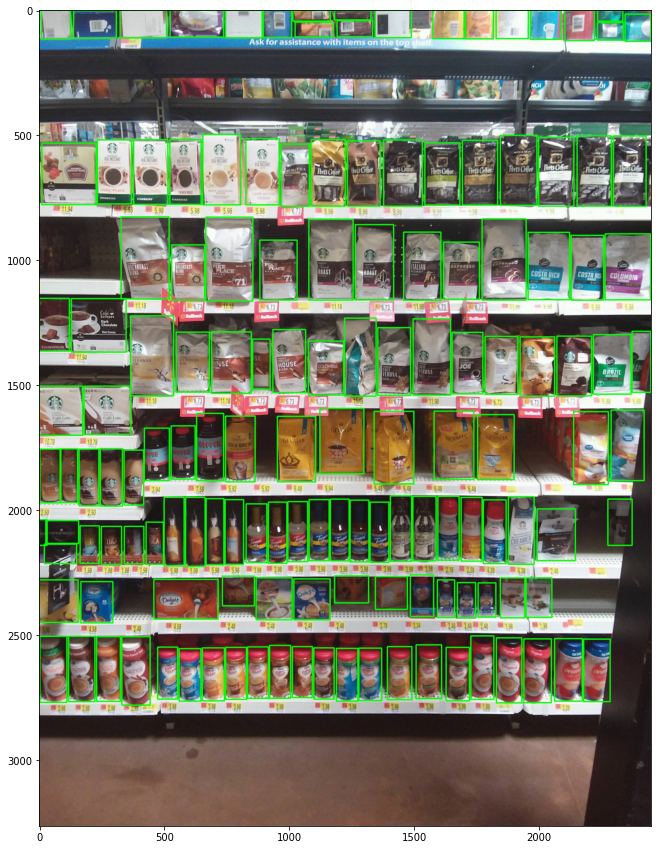

In [24]:
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join('/home/app/src/model/yolov5/runs/detect/yolo_road_det49/test_0.jpg'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

### Comparing ground truth labels vs detected labels

##### Adding ground truth label to the raw image

In [7]:
col_names = ["image_name", "x1", "y1", "x2", "y2", "class", "image_width", "image_height"]
annotations_path = '/home/app/src/model/datasets/SKU-110K/annotations/'
img_test = pd.read_csv(annotations_path+'annotations_test.csv', names=col_names)
img_elem = 'test_0.jpg'
gt_bb = img_test.loc[img_test['image_name'] == img_elem]

img = cv2.imread(os.path.join(single_image))
img_rgb_truth = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Bounding boxes color
color = (0, 255, 0)
   
# Line thickness
thickness = 5

for _, bb in gt_bb.iterrows():
    # Start coordinate, represents the top left corner of rectangle
    start_point = (bb['x1'], bb['y1'])

    # Ending coordinate,represents the bottom right corner of rectangle
    end_point = (bb['x2'], bb['y2'])

    # Using cv2.rectangle() method, Draw a rectangle of black color of thickness -1 px
    img_rgb_truth = cv2.rectangle(img_rgb_truth, start_point, end_point, color, thickness)


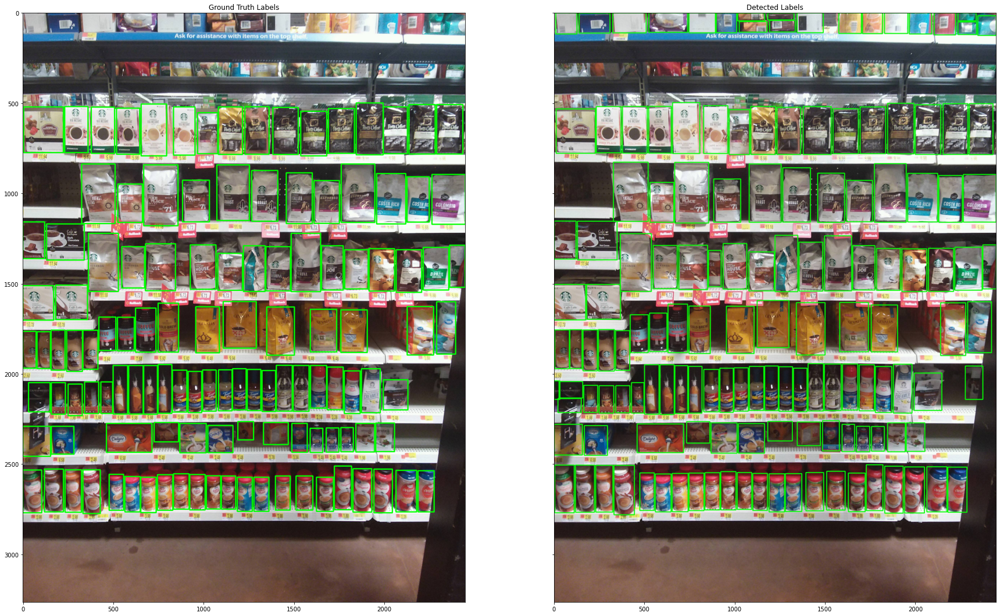

In [8]:
# Create two subplots and unpack the output array immediately
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize = (30,30))
ax1.imshow(img_rgb_truth)
ax1.set_title('Ground Truth Labels')
ax2.imshow(img_rgb)
ax2.set_title('Detected Labels')
plt.show()

## Now, let's test the model in the validation dataset with some of the previous configuration of parameters

### Default: conf_thres=0.001 and iou-thres=0.6

Images : 2935                                   
Labels : 431419     
P : 0.931    
R : 0.842    
mAP@.5: 0.903    
mAP@: 0.588  

In [30]:
!python $validation_script  --weights $weights_file --data $data_sku_110k_yaml --task val --name yolo_road_det --device 0

val: data=/home/app/src/model/yolov5/data/SKU-110K.yaml, weights=['/home/app/src/model/yolov5/runs/train/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=../model/yolov5/runs/val, name=yolo_road_det, exist_ok=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
val: Scanning '/home/app/src/model/datasets/SKU-110K/val.cache' images and label
val: WARNING: /home/app/src/model/datasets/SKU-110K/images/val_0.jpg: corrupt JPEG restored and saved
val: WARNING: /home/app/src/mode

### Default: conf_thres=0.5 and iou-thres=0.5

Images : 2935                                   
Labels : 431419     
P : 0.934   
R : 0.85   
mAP@.5: 0.908     
mAP@: 0.621    


In [31]:
!python $validation_script  --weights $weights_file --data $data_sku_110k_yaml --task test --name yolo_road_det --device 0 --conf-thres 0.5 --iou-thres 0.5

val: data=/home/app/src/model/yolov5/data/SKU-110K.yaml, weights=['/home/app/src/model/yolov5/runs/train/best.pt'], batch_size=32, imgsz=640, conf_thres=0.5, iou_thres=0.5, task=test, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=../model/yolov5/runs/val, name=yolo_road_det, exist_ok=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
test: Scanning '/home/app/src/model/datasets/SKU-110K/test.cache' images and lab
test: WARNING: /home/app/src/model/datasets/SKU-110K/images/test_1029.jpg: corrupt JPEG restored and saved
test: WARNING: /home/app/src

               Class     Images     Labels          P          R     mAP@.5 mAP@WARNING: NMS time limit 1.260s exceeded
               Class     Images     Labels          P          R     mAP@.5 mAP@WARNING: NMS time limit 1.260s exceeded
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: 935 extraneous bytes before marker 0xd9
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: premature end of data segment
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: 70 extraneous bytes before marker 0xd9
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: 358 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: premature end of data segment
               Class     Images     L

### Default: conf_thres=0.25 and iou-thres=0.25

Images : 2935                                   
Labels : 431419     
P : 0.913    
R : 0.872   
mAP@.5: 0.923   
mAP@: 0.622   

In [34]:
!python $validation_script  --weights $weights_file --data $data_sku_110k_yaml --task test --name yolo_road_det --device 0 --conf-thres 0.25 --iou-thres 0.25

val: data=/home/app/src/model/yolov5/data/SKU-110K.yaml, weights=['/home/app/src/model/yolov5/runs/train/best.pt'], batch_size=32, imgsz=640, conf_thres=0.25, iou_thres=0.25, task=test, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=../model/yolov5/runs/val, name=yolo_road_det, exist_ok=False, half=False, dnn=False
fatal: unsafe repository ('/home/app/src/model/yolov5' is owned by someone else)
To add an exception for this directory, call:

	git config --global --add safe.directory /home/app/src/model/yolov5
YOLOv5 🚀 2022-7-7 Python-3.8.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
test: Scanning '/home/app/src/model/datasets/SKU-110K/test.cache' images and lab
test: WARNING: /home/app/src/model/datasets/SKU-110K/images/test_1029.jpg: corrupt JPEG restored and saved
test: WARNING: /home/app/s

               Class     Images     Labels          P          R     mAP@.5 mAP@WARNING: NMS time limit 1.260s exceeded
               Class     Images     Labels          P          R     mAP@.5 mAP@WARNING: NMS time limit 1.260s exceeded
               Class     Images     Labels          P          R     mAP@.5 mAP@WARNING: NMS time limit 1.260s exceeded
Corrupt JPEG data: 935 extraneous bytes before marker 0xd9
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: premature end of data segment
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: 70 extraneous bytes before marker 0xd9
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: 358 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment
               Class     Images     Labels          P          R     mAP@.5 mAP@Corrupt JPEG data: premature end of data segme

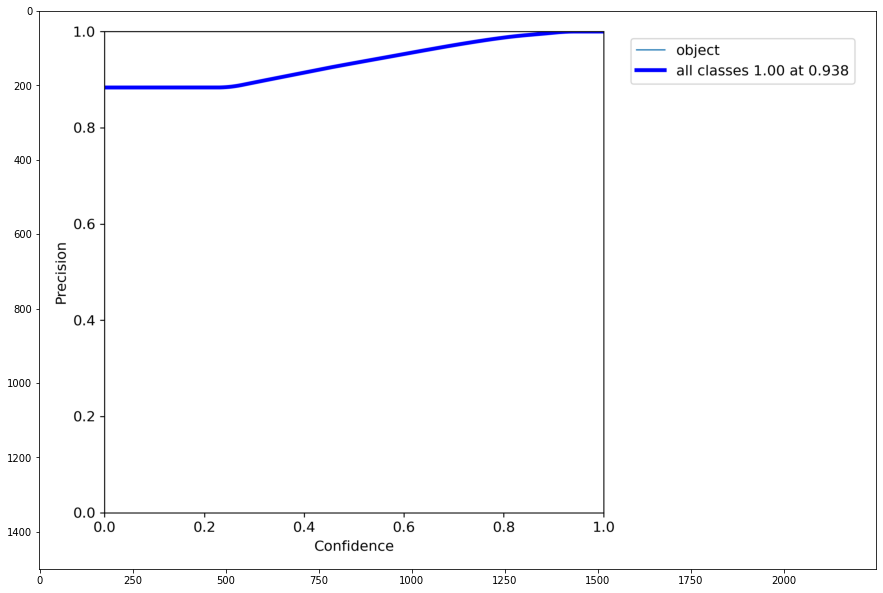

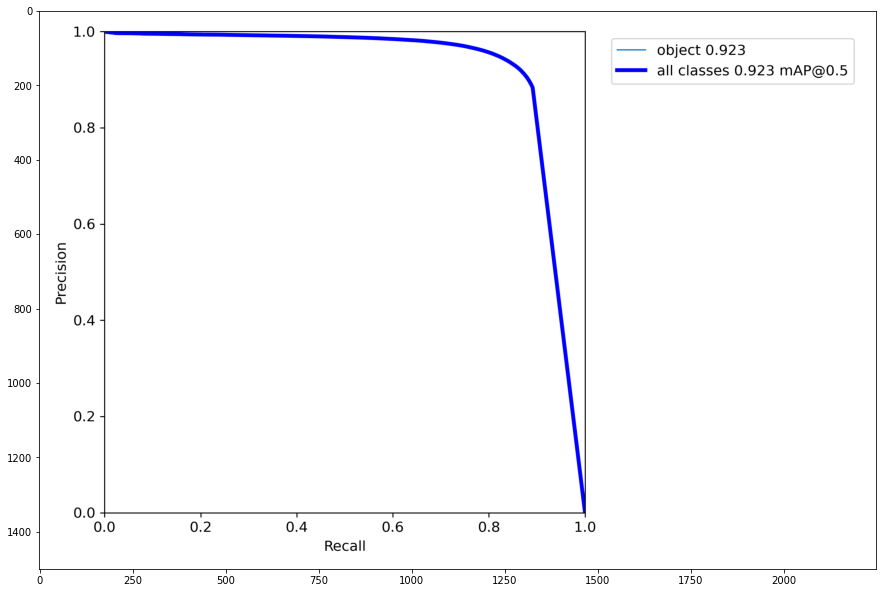

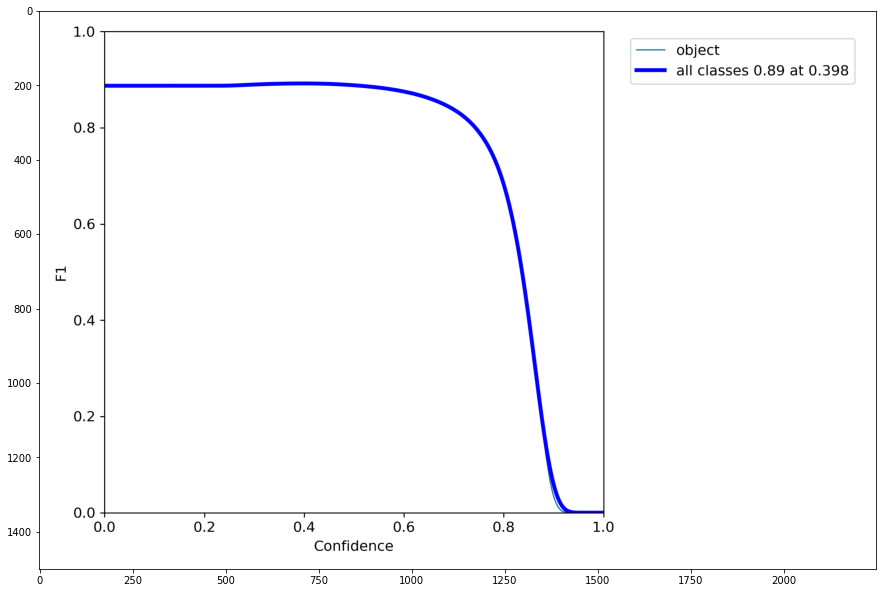

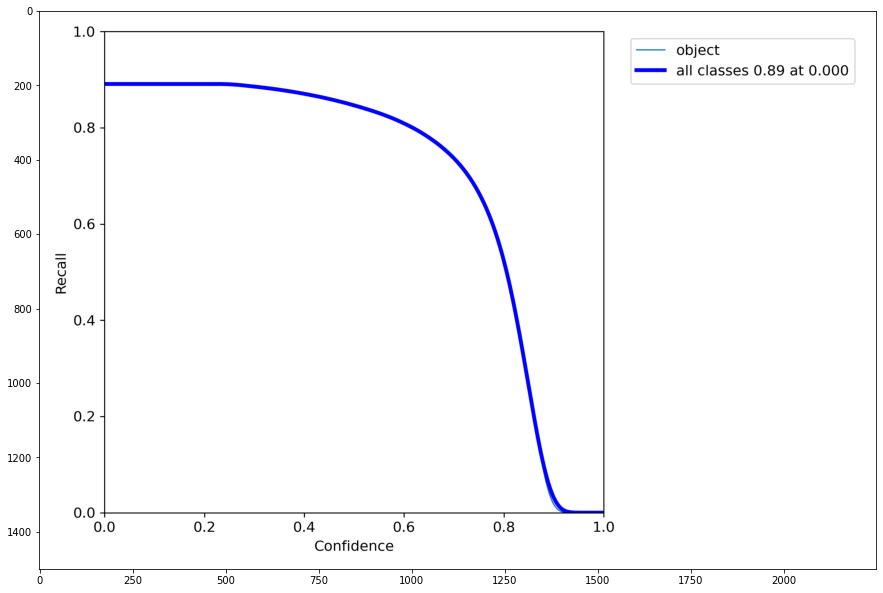

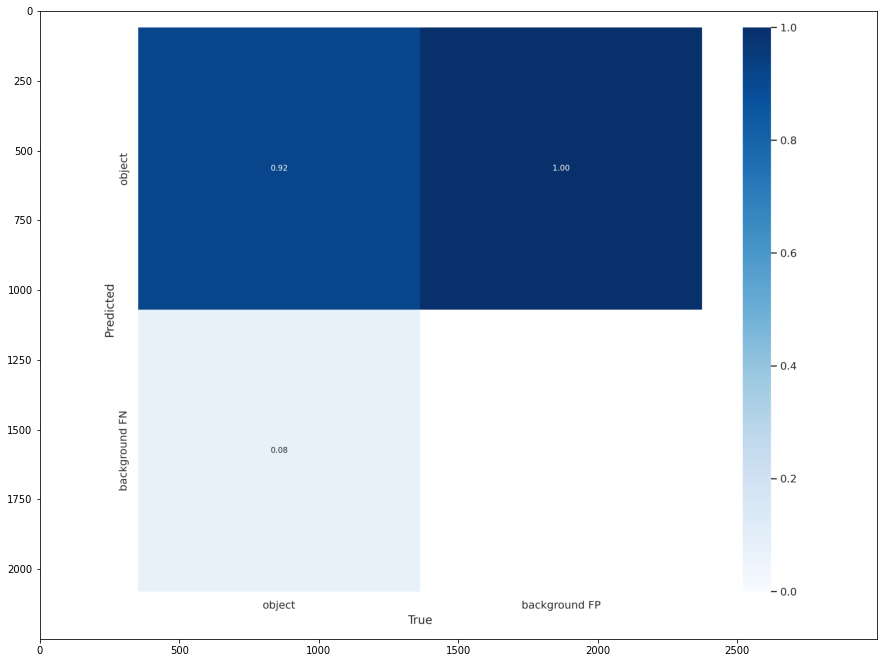

In [35]:
results_path = '/home/app/src/model/yolov5/runs/val/yolo_road_det7'
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join(results_path, 'P_curve.png'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join(results_path, 'PR_curve.png'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join(results_path, 'F1_curve.png'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join(results_path, 'R_curve.png'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()
fig = plt.figure(figsize = (15,15))
img = cv2.imread(os.path.join(results_path, 'confusion_matrix.png'))
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()